# Equilibrium electron beam in plasma

<a href=http://www.inp.nsk.su/~petrenko/>A. Petrenko</a> (CERN, 2018)

Let's assume blow-out regime of PWFA -- i.e. electron focusing is only due to the ion column. Then the radial focusing electric field $E_r(r)$ can be found from the Gauss law (in cgs units)

$$
\oint\limits_S \bf{E} d\bf{s} = 
4\pi\int\limits_V \rho dV
$$
(assuming uniformly charged cyllinder) as
$$
2\pi r L E_r = 4\pi (\pi r^2 L e n),
$$
or
$$
E_r = 2 \pi r e n,
$$

where $n$ is the plasma density, $e$ is the elementary charge ($e>0$ is assumed here).

Suppose we have an electron with the energy $\gamma m c^2$ travelling parallel to the longitudinal axis with initial transverse offset $y_0$. How much transverse momentum will it gain before crossing the axis ($y=0$)? From this transverse momentum we can calculate the equilibrium emitance of the beam.

Equation of motion
$$
\frac{dp_y}{dt} = -eE_y(y)
$$
or
$$
\frac{d\gamma m v_y}{dt} = -2\pi n e^2 y.
$$
This can be simplified using expression for plasma frequency (in cgs) $\omega_p = \sqrt{4\pi n e^2/m}$
$$
\frac{d\gamma v_y}{dt} + \frac{\omega_p^2}{2} y = 0.
$$
And assuming $\gamma \gg 1$ and $v_y \ll c$ we finally get
$$
\frac{dv_y}{dt} + \frac{\omega_p^2}{2\gamma} y = 0,~~~v_y = \frac{dy}{dt},
$$
i.e. the betatron oscillations
$$
\frac{d^2 y}{dt^2} + \omega_b^2 y = 0,
$$
with the frequency
$$
\omega_b = \frac{\omega_p}{\sqrt{2\gamma}}.
$$

The period of betatron oscillations $\lambda_b$ is $\sqrt{2\gamma}$ times longer than the plasma wavelength $\lambda_p$
$$
\lambda_b = \frac{2\pi c}{\omega_p}\sqrt{2\gamma} = \lambda_p\sqrt{2\gamma}.
$$

The solution to the equation of motion with initial conditions $y(0) = y_0$ and $v_y(0) = 0$ is

$$
y = y_0 \cos \omega_b t, ~~~ v_y = -y_0\omega_b \sin \omega_b t.
$$ 

Assuming $y_0 = \sigma_y$ the equilibrium angular spread $\sigma_{y'}$ can be found as
$$
\sigma_{y'} = \frac{v_{y,\max}}{c} = \frac{\sigma_y \omega_b}{c} = \frac{\sigma_y k_p}{\sqrt{2\gamma}},
$$
where $k_p = \omega_p / c$ is the plasma wave vector.

And the normilized RMS-emittance of the equilibrium electron beam
$$
\epsilon_n = \gamma \sigma_y \sigma_{y'} = \sigma_y^2 k_p \sqrt{\frac{\gamma}{2}}
$$

## Example

In [1]:
n = 7e14 # 1/cm^3
p = 50 # MeV/c
sigma_y = 10 # microns

In [2]:
import numpy as np
from IPython.display import Latex

In [3]:
mc = 0.511 # MeV/c

gamma = p/mc

Plasma frequency in cgs units

$$
\omega_p = \sqrt{\frac{4\pi n_e e^2}{m}}
$$

this can be written in an easier to understand form which also does not depend on the system of units:

$$
\omega_p = c\sqrt{\frac{4\pi n_e e^2}{mc^2}} = c\sqrt{4\pi n_e r_e},
$$

where $r_e$ is the calssical electron radius (why people always use the first expression is a mistery to me).

In [4]:
c = 2.9979245800e8 # m/sec
r_e = 2.81794032e-15 # m

w_p = c*np.sqrt(4*np.pi*(n*1e6)*r_e) # rad/sec

E_0 = 0.511e-3/(c/w_p) # GV/m

Latex("$c/\omega_p$ = %.4f mm, $\lambda_p$ = %.4f mm, $E_0$ = %.4f GV/m." %
      (1e3*c/w_p, 1e3*2*np.pi*c/w_p, E_0))

<IPython.core.display.Latex object>

In [5]:
k_p = w_p/c

sigma_yp = 1e3*sigma_y*1e-6*k_p/np.sqrt(2*gamma) # mrad

emitt_n = sigma_y * 1e-3 * sigma_yp * gamma # mm*mrad

lambda_b = 1e3*np.sqrt(2*gamma)*2*np.pi*c/w_p # mm

In [6]:
Latex(r"""
\begin{aligned}

\sigma_y~   &= %.1f~\mu\rm{m}, \\
\sigma_{y'} &= %.1f~\rm{mrad}, \\
\lambda_b~  &= %.1f~\rm{mm},   \\
\epsilon_n~ &= %.1f~\rm{mm}\cdot\rm{mrad}. \\

\end{aligned}
""" % (sigma_y, sigma_yp, lambda_b, emitt_n))

<IPython.core.display.Latex object>

In [7]:
10e-6/0.2008e-3

0.04980079681274901

Plot $\epsilon_n$ vs beam size $\sigma_y$.


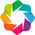

In [8]:
import holoviews as hv

hv.extension('matplotlib', 'bokeh')

In [9]:
sigma_y = np.linspace(0, 30, num=100)
sigma_yp = 1e3*sigma_y*1e-6*k_p/np.sqrt(2*gamma) # mrad

emitt_n = sigma_y * 1e-3 * sigma_yp * gamma # mm*mrad

In [10]:
%output backend='matplotlib' fig="svg"

%opts Curve [show_grid=True aspect=2 fig_size=200 fontsize=12] (linewidth=3)

In [11]:
hv.Curve((sigma_y,emitt_n), kdims=['$\sigma_y$ ($\mu$m)'],
         vdims=['RMS-emittance $\epsilon_n$ (mm$\cdot$mrad)'])

:Curve   [$\sigma_y$ ($\mu$m)]   (RMS-emittance $\epsilon_n$ (mm$\cdot$mrad))

## Test this example in <a href=http://www.inp.nsk.su/~lotov/lcode>LCODE</a> simulation

Here we simulate two-bunch PWFA in the blow-out regime with the witness bunch produced according to above theory.

It's convenient to put lcode.cfg file into a separate directory:

In [12]:
# Here is the content in case the lcode.cfg file is lost:
with open("LCODE/lcode.cfg", "r") as f:
    print(f.read())

# Simulation area:
geometry = c
window-width = 6;       r-step = 0.005
window-length = 5;     xi-step = 0.005
time-limit = 72.1; time-step = 1
continuation = n # Plasma continuation (no/beam/longplasma, n/y/Y)
# Particle beams:
beam-current = -0.059
# 1 kA

rigid-beam = n
beam-substepping-energy = 2
focusing = n # External beam focusing (no/cosine/rectangular, n/c/r)
foc-period = 100
foc-strength = 0.01
beam-particles-in-layer = 500
beam-profile = """
xishape=l, ampl=50.1, length=0.60, rshape=g, radius=1.000, angshape=l, angspread=1e-16, energy=7.83e15, vshift=0, eshape=m, espread=0, m/q=1836e10
xishape=l, ampl=0.00, length=3.20
xishape=c, ampl=0.01, length=0.80, rshape=g, radius=0.050, angshape=l, angspread=3.6e-3, energy=97.847, vshift=0, eshape=m, espread=0, m/q=1
"""
beam-tune-charge = n;       beam-regulate-layer = n
rng-seed = 1
# Laser beams:
laser = n
# Plasma:
plasma-model = P # Plasma model (fluid/particles/newparticles, f/p/P)
magnetic-field = 0
magnetic-field-type = c;    m

In [13]:
#cd LCODE

In [14]:
#ls

In [15]:
#rm beamfile.* *.log *.swp *.png *.dat *.progress.*

In [16]:
# This step is usually done on external MPI cluster

#!mpirun -n 2 ~/bin/lcode
# LCODE is reading its input form the lcode.cfg file.

# also can be run with a single core version currently availiable online:
#~/bin/lcode

In [17]:
#ls -all -h

In [18]:
# We don't need large beamfile.bin and beamfile.bit:

In [18]:
rm LCODE/beamfile.*

In [19]:
# just to be able to plot everything without running LCODE again in the future

In [20]:
#cd ../

### Plot the resulting fieldmaps:

In [21]:
import parse
import os

In [22]:
with open('LCODE/lcode.runas.cfg', 'r') as f:
    text = f.read()
    dr  = parse.search("r-step = {:g}", text)[0]
    dxi = parse.search("xi-step = {:g}", text)[0]
    xi0 = parse.search("subwindow-xi-from = {:g}", text)[0]
    r_skip  = parse.search("output-skipping-r = {:g}", text)[0]
    xi_skip = parse.search("output-skipping-xi = {:g}", text)[0]   

dim_xi   = hv.Dimension('xi', unit='mm', label="ξ") # range=(-80,0))
dim_r = hv.Dimension('r', unit='mm', range=(0,None))

In [23]:
%opts Image [aspect=1 fig_size=100 colorbar=True] (cmap='bwr')

In [24]:
def plot_fmap(swp, field_range=(None,None)):
    field_name = os.path.basename(swp)[0:2]

    A = np.loadtxt(swp)
    [Nxi, Nr] = A.shape
    
    A = A.transpose()
    A = A[::-1,::-1]
    
    r_max = dr*r_skip*Nr*1e3*c/w_p
    bounds=((xi0-dxi*Nxi)*xi_skip*1e3*c/w_p, 0, xi0*1e3*c/w_p, r_max)
    
    dim_field = hv.Dimension(field_name, unit='Plasma units', range=field_range)
    
    img = hv.Image(A, bounds=bounds, kdims=[dim_xi,dim_r], vdims=dim_field, label=swp)
    return img

In [26]:
plot_fmap('LCODE/er00040w.swp', field_range=(-1,1))

:Image   [xi,r]   (er)

In [27]:
ne_map = plot_fmap('LCODE/ne00040w.swp', field_range=(0,2)).options(cmap='inferno')

In [28]:
ne_map

:Image   [xi,r]   (ne)

Now read particle trajectories from partic.swp

In [65]:
import pandas as pd

In [66]:
cols = ['t', 'xi', 'r', 'pz', 'pr', 'M', 'c2m', 'q', 'id']

df = pd.read_table('LCODE/partic.swp', header=None, delim_whitespace=True, names=cols, dtype='float32')

In [67]:
df.tail(3)

,t,xi,r,pz,pr,M,c2m,q,id
20334,72.0,-4.491077,0.083620,129.890106,-0.141708,0.031291,1.0,-0.000236,2981344.0
20335,72.0,-4.508106,0.072864,130.322296,0.312397,-0.013581,1.0,-0.000236,2981347.0
20336,72.0,-4.516157,0.041828,130.523193,-0.712623,-0.018527,1.0,-0.000236,2981349.0


In [68]:
df['xi'] = df['xi']*1e3*c/w_p # mm
df['r']  = df['r']*1e3*c/w_p # mm

In [69]:
df['pr']  = df['pr']*0.511 # MeV/c
df['pz']  = df['pz']*0.511 # MeV/c
dim_pr = hv.Dimension('pr', unit='MeV/c', range=(-1,+1))
dim_pz = hv.Dimension('pz', unit='MeV/c', range=(0,+80))

In [70]:
%output backend='bokeh'

In [71]:
%opts Scatter [show_grid=True width=280 height=280]
%opts Image [colorbar=False]

In [72]:
def plot_e(t):
    dfs = df[df.t == t]

    xi_r  = hv.Scatter(dfs, kdims=[dim_xi,dim_r])
    pr_r  = hv.Scatter(dfs, kdims=[dim_pr,dim_r])
    xi_pz = hv.Scatter(dfs, kdims=[dim_xi,dim_pz])
    pr_pz = hv.Scatter(dfs, kdims=[dim_pr,dim_pz])
    
    return (ne_map*xi_r + pr_r + xi_pz + pr_pz).cols(2)

In [74]:
#plot_e(df.t.values[0])

Now add slider to select time:

In [75]:
items = [(t, plot_e(t)) for t in df.t.values[::3]]

m = hv.HoloMap(items, kdims = ['Time'])
m = m.collate()

In [76]:
m

:Layout
   .Overlay.I   :HoloMap   [Time]
      :Overlay
         .Image.LCODE_over_ne00040w_full_stop_swp :Image   [xi,r]   (ne)
         .Scatter.I                               :Scatter   [xi,r]   (t,pz,pr,M,c2m,q,id)
   .Scatter.I   :HoloMap   [Time]
      :Scatter   [pr,r]   (t,xi,pz,M,c2m,q,id)
   .Scatter.II  :HoloMap   [Time]
      :Scatter   [xi,pz]   (t,r,pr,M,c2m,q,id)
   .Scatter.III :HoloMap   [Time]
      :Scatter   [pr,pz]   (t,xi,r,M,c2m,q,id)

### Plot selected trajectory:

$\xi = z - ct$, therefore $z = \xi + ct$.

In [77]:
df['z'] = df['xi'] + df['t']*1e3*c/w_p # mm

In [78]:
df.tail(3)

,t,xi,r,pz,pr,M,c2m,q,id,z
20334,72.0,-0.902050,0.016795,66.373840,-0.072413,0.031291,1.0,-0.000236,2981344.0,13.559426
20335,72.0,-0.905470,0.014635,66.594688,0.159635,-0.013581,1.0,-0.000236,2981347.0,13.556005
20336,72.0,-0.907087,0.008401,66.697350,-0.364150,-0.018527,1.0,-0.000236,2981349.0,13.554389


Select a particle:

In [169]:
pid = df[df.r > 0.01].id.sample(1).values[0] # select a particle with r > 0.01 mm
pid

2981197.0

In [170]:
dfs = df[df.id == pid]

In [171]:
dfs.tail(3)

,t,xi,r,pz,pr,M,c2m,q,id,z
19668,70.0,-0.853515,0.015004,62.879772,-0.145730,0.006245,1.0,-0.000236,2981197.0,13.206253
19951,71.0,-0.853523,0.014514,63.066647,-0.161060,0.006245,1.0,-0.000236,2981197.0,13.407100
20234,72.0,-0.853530,0.013978,63.253571,-0.176344,0.006245,1.0,-0.000236,2981197.0,13.607946


In [172]:
dim_z   = hv.Dimension('z', unit='mm')

In [173]:
z_r  = hv.Scatter(dfs, kdims=[dim_z, dim_r])
pr_r = hv.Scatter(dfs, kdims=[dim_pr, dim_r])

In [174]:
z_r + pr_r

:Layout
   .Scatter.I  :Scatter   [z,r]   (t,xi,pz,pr,M,c2m,q,id)
   .Scatter.II :Scatter   [pr,r]   (t,xi,pz,M,c2m,q,id,z)

Everything looks close to the above theory!